# Install dependencies

In [ ]:
!pip install diffusers transformers accelerate safetensors huggingface_hub gradio --upgrade

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 484.3/484.3 kB 13.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.1/54.1 MB 18.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 322.9/322.9 kB 28.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 95.2/95.2 kB 8.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.6/53.6 MB 13.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.5/11.5 MB 125.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 72.0/72.0 kB 6.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 114.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 93.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 60.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 

In [ ]:
# from google.colab import userdata

# hf_token = userdata.get("HuggingFace")
# login(token=hf_token)

In [ ]:
from diffusers import StableDiffusionPipeline, UniPCMultistepScheduler
import torch
import gc
import matplotlib.pyplot as plt
import gradio as gr
import random

In [ ]:
model_name = "digiplay/PerfectWorld_v4"

In [ ]:
pipe = StableDiffusionPipeline.from_pretrained(
    model_name,
    torch_dtype=torch.float16,
    #use_safetensors=True
).to("cuda")

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/593 [00:00<?, ?B/s]

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

scheduler_config.json:   0%|          | 0.00/427 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

config.json:   0%|          | 0.00/560 [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/520 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/737 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/1.69k [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

config.json:   0%|          | 0.00/606 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/4.59k [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/transformers/models/clip/feature_extraction_clip.py:28: FutureWarning: The class CLIPFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use CLIPImageProcessor instead.
  warnings.warn(


In [ ]:
pipe = StableDiffusionPipeline.from_pretrained(
    model_name,
    torch_dtype=torch.float16,
    use_safetensors=True
).to("cuda")

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

In [ ]:
pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)

### Generating

In [ ]:
def generate_images(prompt, use_enhance, enhance_text, use_negative, negative_text,
                    use_custom_seed, custom_seed, height, width, steps, num_images):

    height = int(height)
    width = int(width)

    if height % 8 != 0 or width % 8 != 0:
        raise ValueError("Height and width must be multiples of 8！")

    if use_custom_seed:
        base_seed = int(custom_seed)
    else:
        base_seed = random.randint(0, 2**32 - 1)

    seeds = [base_seed + i for i in range(num_images)]

    prompts = []
    negative_prompts = []
    generators = []

    final_prompt = prompt
    if use_enhance and enhance_text:
        final_prompt = prompt + ", " + enhance_text

    final_negative = negative_text if use_negative else None

    for seed in seeds:
        g = torch.Generator("cuda").manual_seed(seed)
        generators.append(g)
        prompts.append(final_prompt)
        negative_prompts.append(final_negative)

    gc.collect()
    torch.cuda.empty_cache()

    images = []
    for i in range(num_images):
        with torch.no_grad():
            image = pipe(
                prompt=prompts[i],
                negative_prompt=negative_prompts[i] if final_negative else None,
                height=height,
                width=width,
                num_inference_steps=steps,
                guidance_scale=7.5,
                generator=generators[i]
            ).images[0]
            images.append(image)

    return images, f"Using random seeds: {seeds}"

### Gradio Web App

In [ ]:
default_enhance = '''photorealistic, ultra-realistic, ultra high quality, 4k resolution, sharp focus,
cinematic lighting, volumetric lighting, dramatic shadows, soft color palette, moody atmosphere,
natural setting, serene expression, intricate facial detail, intricate skin details, detailed background,
powerful emotional presence, masterpiece, inspired by Annie Leibovitz and Monet,award-winning photograph'''

default_negative = '''unrealistic proportions, distorted face, duplicate features, cartoonish, low quality, worst quality,
unrealistic lighting, overexposed lighting, unnatural colors, pixelation,
bad anatomy, blurry, disfigured, poorly drawn hands, extra fingers, mutated hands,
'''

with gr.Blocks(css='''
.gradio-container {background-color: #ddbbf0; padding: 25px;}
.gr-button {font-size: 18px; background: linear-gradient(to right, #5baff0, #764ba2); color: white;}
h1 {
    color: #4b0082;
}
p {
    color: #333333;
}''') as demo:
    gr.Markdown('''
    # 🎨 PerfectWorld_v4 Interactive Image Generator
    Welcome! Please enter a prompt, choose your settings, and instantly generate your realistic-style creation!
    ''')
    with gr.Row():
        with gr.Column(scale=6):
            prompt = gr.Textbox(label="Prompt", placeholder="Enter your prompt here", lines=3)
            with gr.Row():
                use_enhance = gr.Checkbox(label="Enhance Prompt", value=True)
                enhance_text = gr.Textbox(label="Enhancement Text", value=default_enhance)
            with gr.Row():
                use_negative = gr.Checkbox(label="Use Negative Prompt", value=True)
                negative_text = gr.Textbox(label="Negative Prompt Content", value=default_negative)
            with gr.Row():
                use_custom_seed = gr.Checkbox(label="Use Custom Random Seed", value=False)
                custom_seed = gr.Number(label="Custom Seed (optional)", value=67)
            with gr.Row():
                height = gr.Dropdown(["512", "768", "1024"], label="Image Height", value="512")
                width = gr.Dropdown(["512", "768", "1024"], label="Image Width", value="512")
            with gr.Row():
                steps = gr.Slider(10, 50, value=20, step=5, label="Generation Steps")
                num_images = gr.Slider(1, 4, step=1, value=1, label="Number of Images")
            generate_btn = gr.Button("🚀 Generate Now!")

        with gr.Column(scale=6):
            gallery = gr.Gallery(label="Generated Results", columns=2, object_fit="contain", height="auto")
            seed_info = gr.Label(label="Random Seeds Used")

    generate_btn.click(
        fn=generate_images,
        inputs=[prompt, use_enhance, enhance_text, use_negative, negative_text,
                use_custom_seed, custom_seed, height, width, steps, num_images],
        outputs=[gallery, seed_info]
    )

In [ ]:
demo.launch(share=True, debug=True)

Colab notebook detected. This cell will run indefinitely so that you can see errors and logs. To turn off, set debug=False in launch().
* Running on public URL: https://dccc3b58cc57b58c1c.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


Token indices sequence length is longer than the specified maximum sequence length for this model (131 > 77). Running this sequence through the model will result in indexing errors
The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', cinematic lighting, volumetric lighting, dramatic shadows, soft color palette, moody atmosphere, natural setting, serene expression, intricate facial detail, intricate skin details, detailed background, powerful emotional presence, masterpiece, inspired by annie leibovitz and monet, award - winning photograph']


  0%|          | 0/20 [00:00<?, ?it/s]

The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['high quality, 4 k resolution, sharp focus, cinematic lighting, volumetric lighting, dramatic shadows, soft color palette, moody atmosphere, natural setting, serene expression, intricate facial detail, intricate skin details, detailed background, powerful emotional presence, masterpiece, inspired by annie leibovitz and monet, award - winning photograph']


  0%|          | 0/20 [00:00<?, ?it/s]

The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['lighting, volumetric lighting, dramatic shadows, soft color palette, moody atmosphere, natural setting, serene expression, intricate facial detail, intricate skin details, detailed background, powerful emotional presence, masterpiece, inspired by annie leibovitz and monet, award - winning photograph']


  0%|          | 0/20 [00:00<?, ?it/s]

The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', 4 k resolution, sharp focus, cinematic lighting, volumetric lighting, dramatic shadows, soft color palette, moody atmosphere, natural setting, serene expression, intricate facial detail, intricate skin details, detailed background, powerful emotional presence, masterpiece, inspired by annie leibovitz and monet, award - winning photograph']


  0%|          | 0/20 [00:00<?, ?it/s]

The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', 4 k resolution, sharp focus, cinematic lighting, volumetric lighting, dramatic shadows, soft color palette, moody atmosphere, natural setting, serene expression, intricate facial detail, intricate skin details, detailed background, powerful emotional presence, masterpiece, inspired by annie leibovitz and monet, award - winning photograph']


  0%|          | 0/20 [00:00<?, ?it/s]

The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', 4 k resolution, sharp focus, cinematic lighting, volumetric lighting, dramatic shadows, soft color palette, moody atmosphere, natural setting, serene expression, intricate facial detail, intricate skin details, detailed background, powerful emotional presence, masterpiece, inspired by annie leibovitz and monet, award - winning photograph']


  0%|          | 0/20 [00:00<?, ?it/s]

Keyboard interruption in main thread... closing server.
Killing tunnel 127.0.0.1:7860 <> https://dccc3b58cc57b58c1c.gradio.live


# 先測試純風景圖，莫內風格的四季，春夏差不多，所以只放一張

<font size =5 color="red">
風景大致上，相較於人像，都做的不錯，沒有太鬼異的地方
</font>

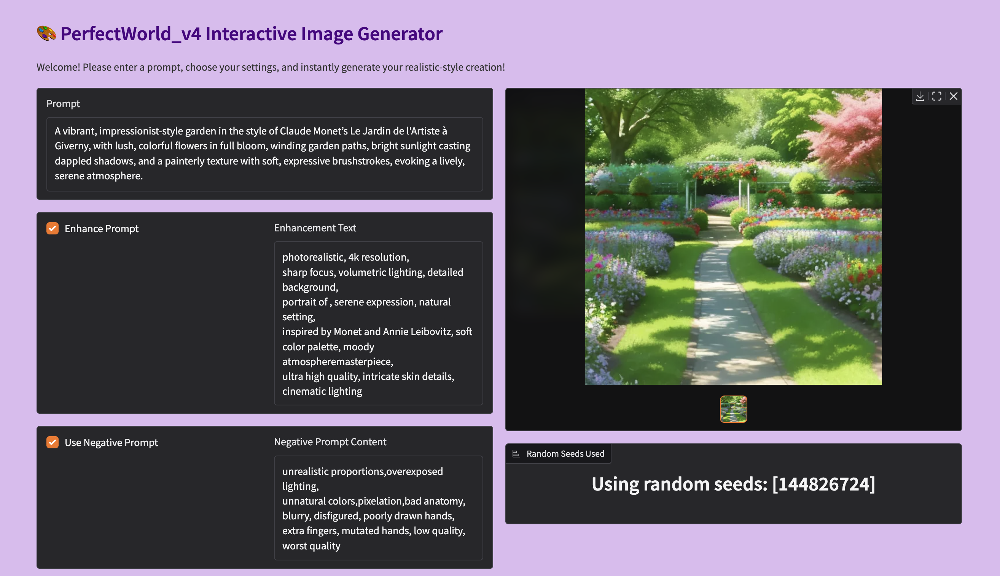

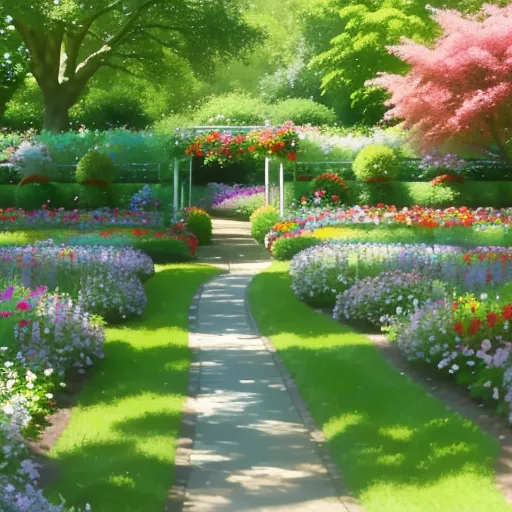

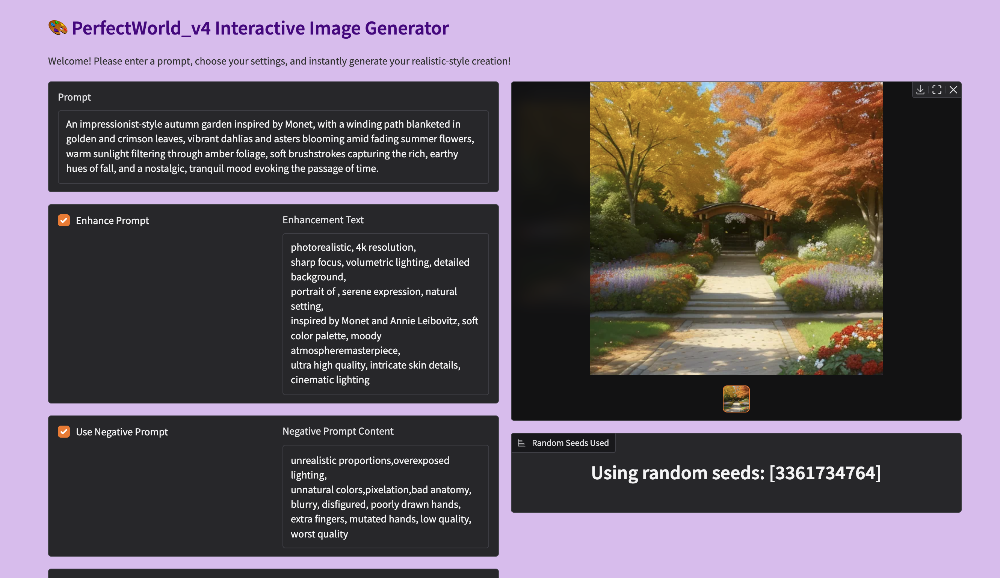

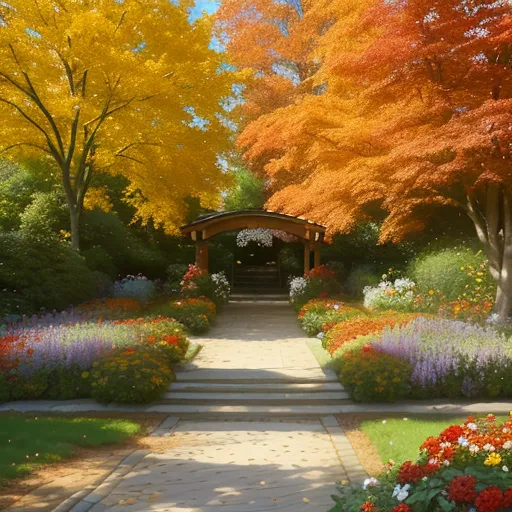

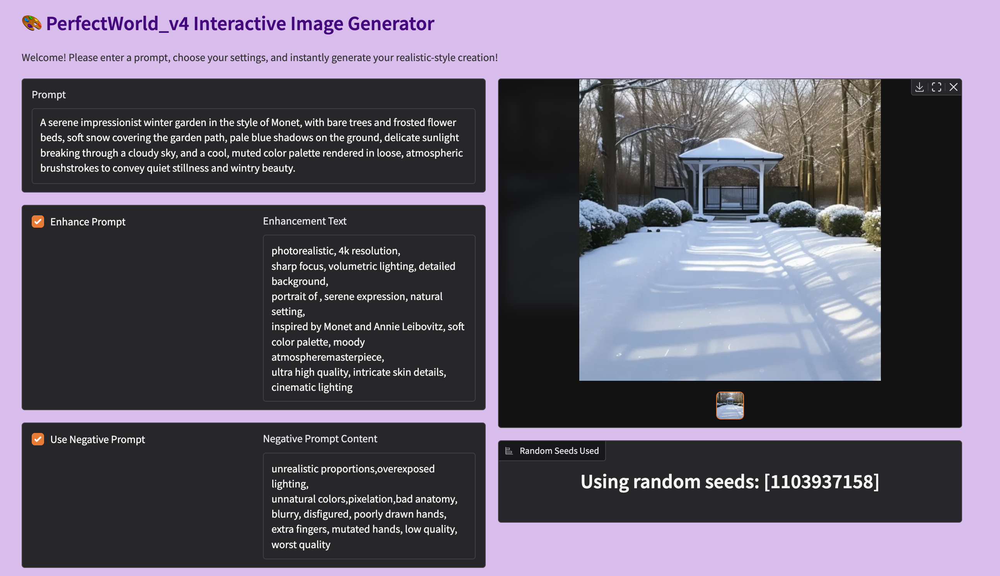

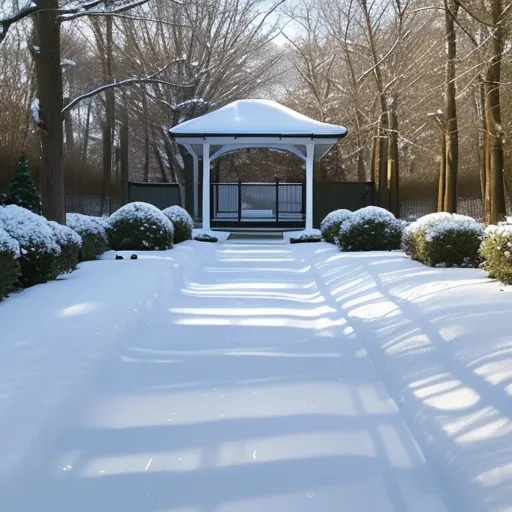

# 測試人像

## 各地區原住民圖像生成

# 測試多次後，發現對於人像，背景若要越寬廣，越豐富，則人像臉部，手指等細節，越模糊

<font size=5>
對比下列兩張圖, prompt分別為有沒有加紅字的部分。<br>   
A portrait of an indigenous woman from Mexico, wearing a vibrant woven skirt and traditional hat, <font color="red"><b>standing in a terraced mountain field at golden hour</b></font>, photographed in the style of Annie Leibovitz — dramatic lighting, rich textures, cinematic composition, expressive eyes, soft shadows, high-resolution, fine art photography.<br>
下方有加的那張，臉和手都變得模糊，變形
</font>

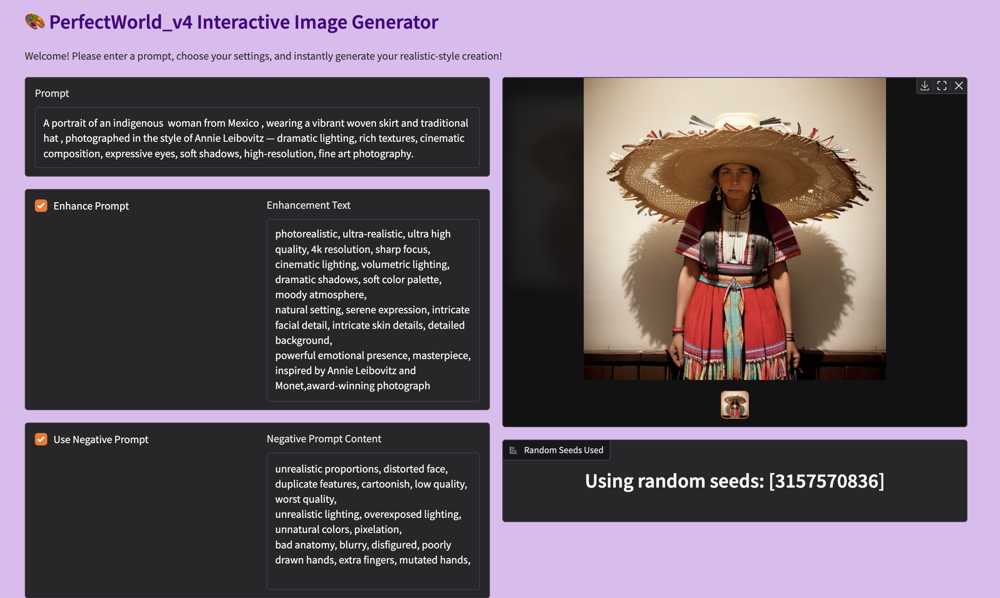

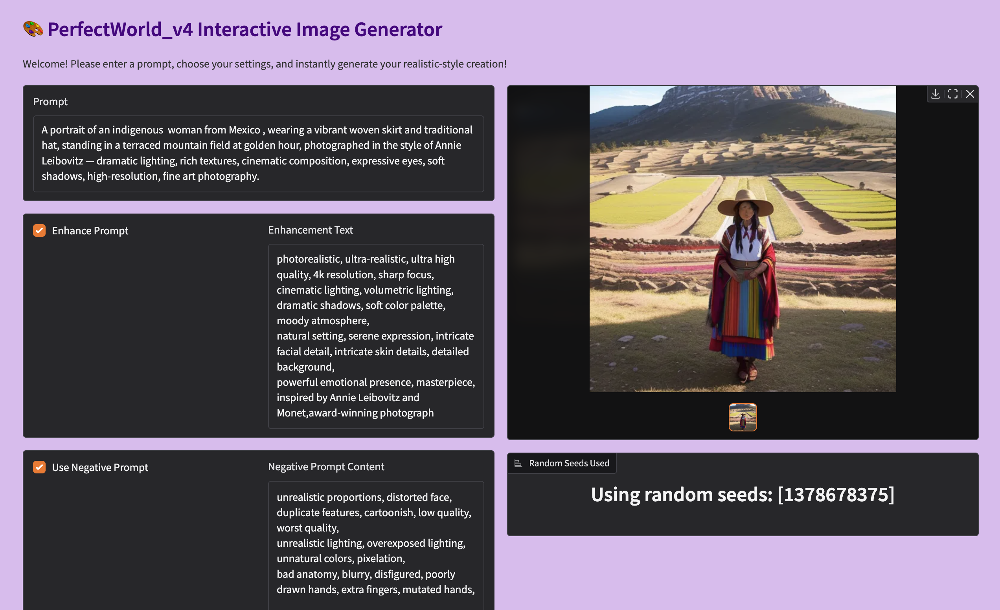

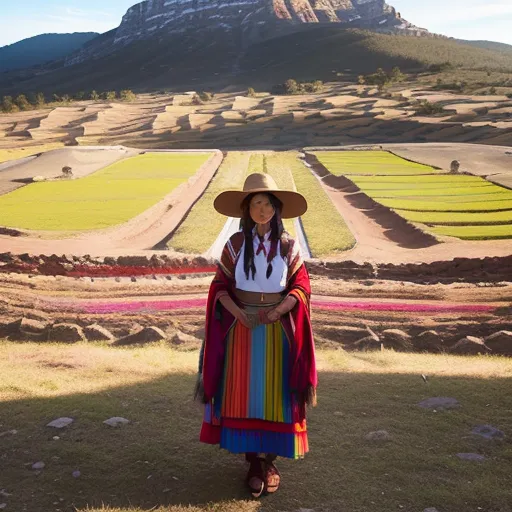

## 問問Chatgpt造成這樣的原因

> 要考慮 tradeoff



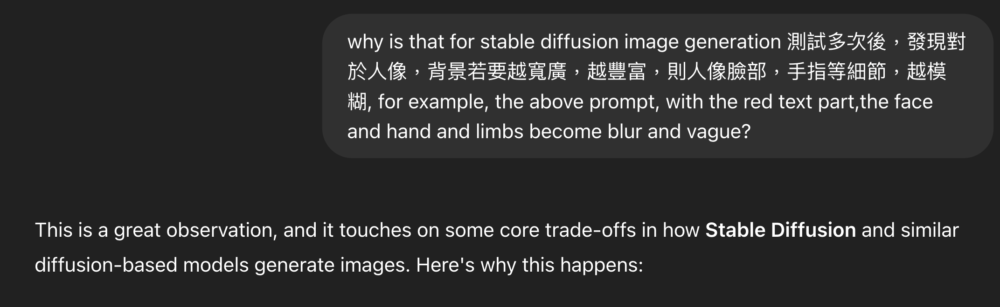

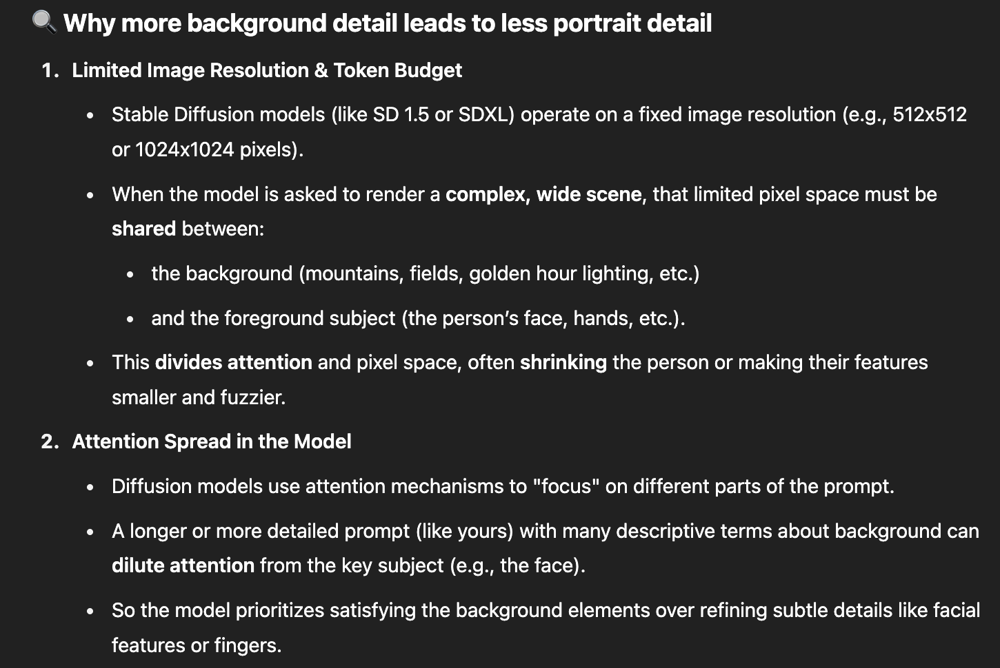

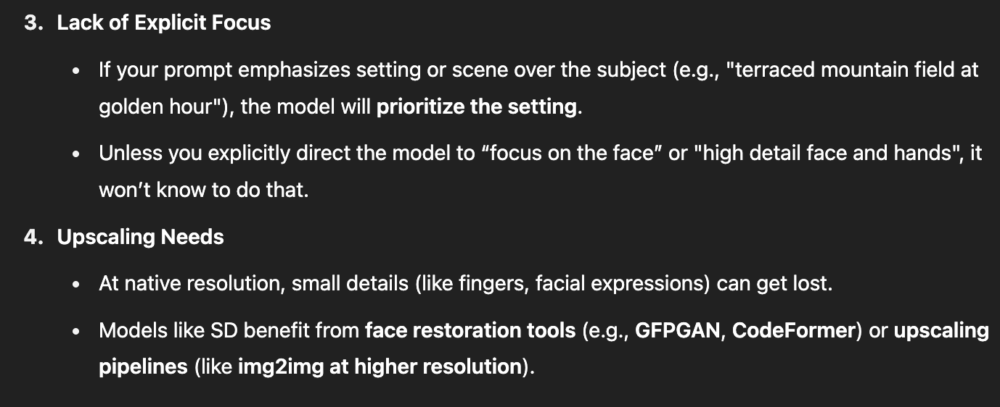

<font size=5>
另外，人像的地區不能寫得太細，要廣泛一點，或用較常見的族群，否則可能訓練資料太少，反而做出來的圖片風格怪異
</font>

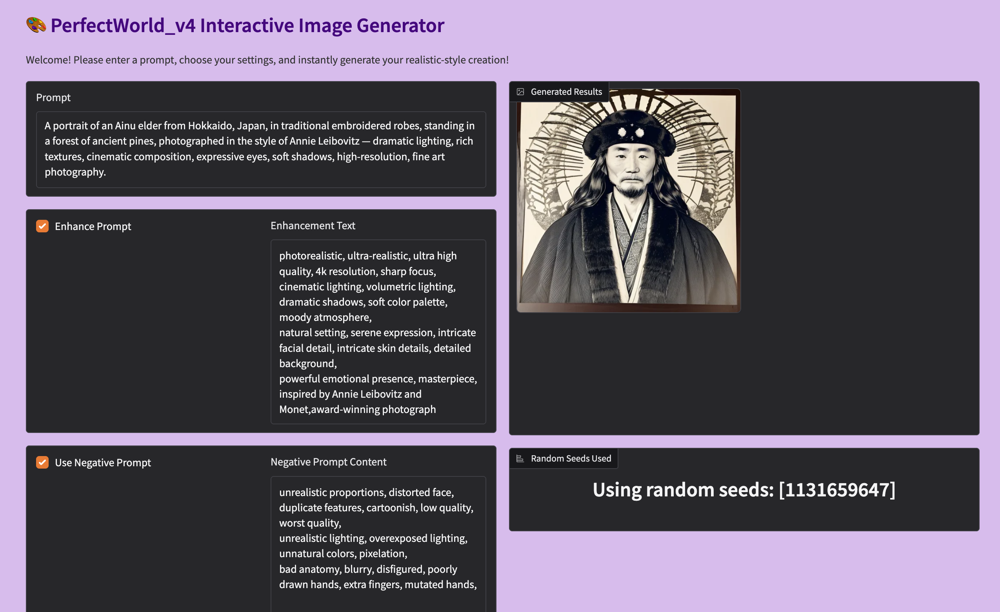

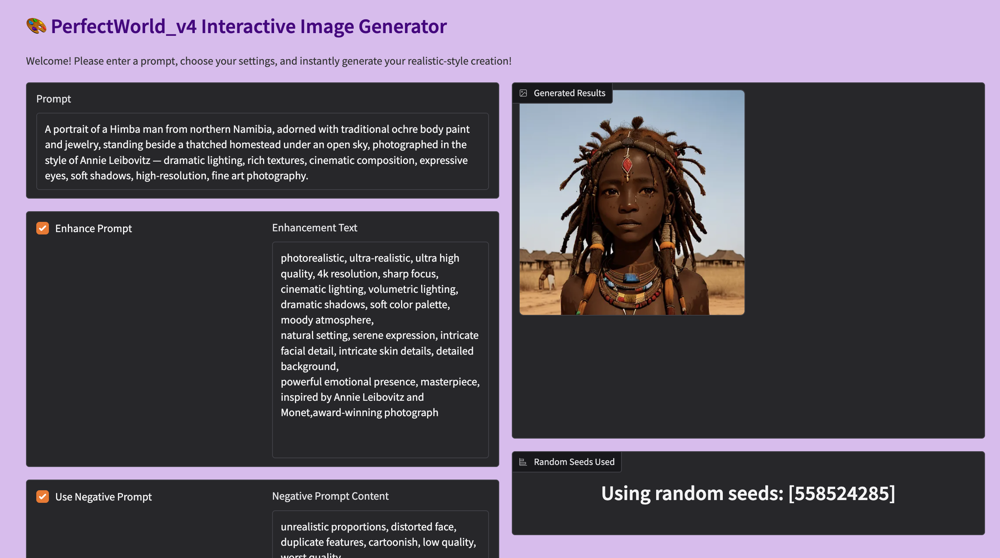

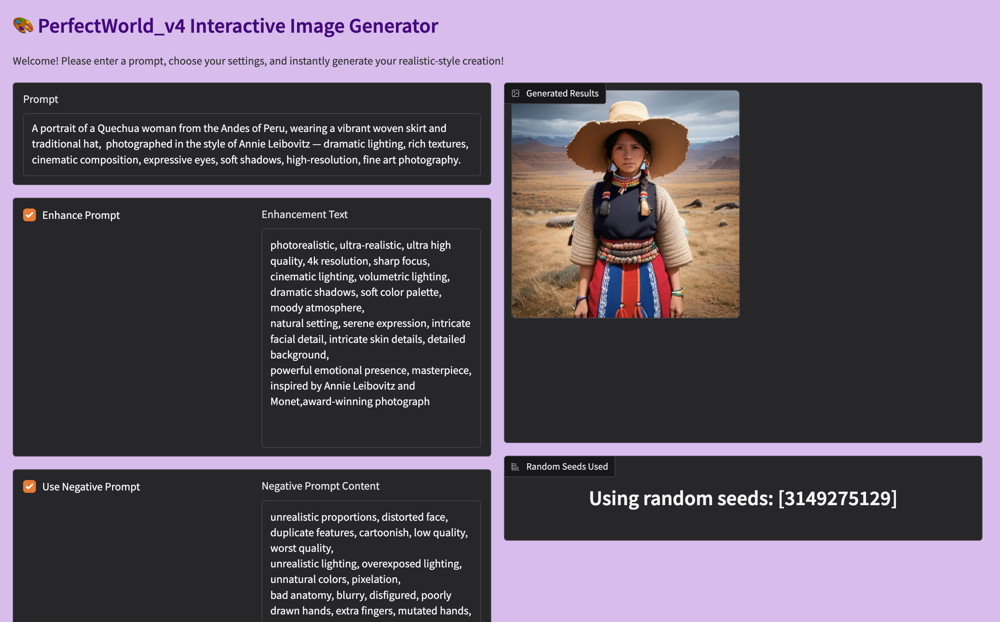